In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import math as math
import matplotlib.animation as animation
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)


# Generating data

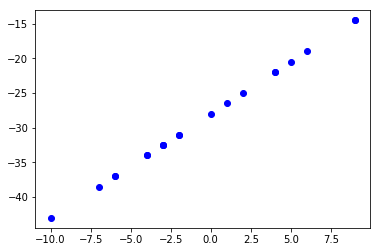

In [7]:
np.random.seed(7)
a_real = 1.5
b_real = -28
xlim = [-10,10]
x_gen = np.random.randint(low=xlim[0], high=xlim[1], size=20)
# x_gen = np.arange(xlim[0], xlim[1], step)
y_real = a_real*x_gen + b_real
plt.plot(x_gen, y_real, 'bo')
plt.savefig('simple_data.png')


# Vanilla SGD

In [8]:
def gradient_descent(x,y, a, b, alpha, epochs=1):
    for e in range(epochs):
        for x_ , y_ in zip(x,y):
            a = a - alpha*2*x_*(a*x_+b-y_)
            b = b - alpha*2*(a*x_+b-y_)        
    return a,b
a,b = gradient_descent(x_gen,y_real,0,0,0.001,epochs=150) 
print("a={:.3f} , b={:.3f}".format(a,b))

a=1.501 , b=-27.913


# Momemtum Update

In [9]:
def sgd_momentum(X,Y, a, b, lr,  beta, epochs=1):
    avg_ga = 0
    avg_gb = 0
    for e in range(epochs):
        for x_ , y_ in zip(X,Y):
            de_da = 2*x_*(a*x_+b-y_)
            de_db = 2*(a*x_+b-y_) 
            avg_ga = avg_ga*beta + (1.0-beta)*de_da
            avg_gb = avg_gb*beta + (1.0-beta)*de_db
            a = a - lr*avg_ga
            b = b - lr*avg_gb        
    return a,b

    
a,b = sgd_momentum(x_gen,y_real,0,0,0.001,0.01, epochs=100)    
print("a={} , b={}".format(a,b))


a=1.5061393757070551 , b=-27.526506994568695


# SGD/Momemtum/Adam/Adam+lr annealing - no metric and no visualization

In [13]:
def mse(x,y,f,params):
    y_pred = f(params,x)
    diff_sq = (y_pred-y)*(y_pred-y)
    loss = diff_sq.sum() / len(x)
    return loss

def lin(params,x):
    return params[0]*x + params[1]

def linear_gradients(params_to_learn,x,y):
    a = params_to_learn[0] 
    b = params_to_learn[1]
    de_da = 2*x*(a*x+b-y)
    de_db = 2*(a*x+b-y)  
    
    return [de_da,de_db]

def gradient_descent(X,Y, init_params, f, gradients_func, optim, optim_params, epochs=1, anneal_epoch_freq=5):
    params_to_learn = init_params.copy()
    wavg_grads = [0] * len(params_to_learn) #used if optim = Momentum or Adam
    wavg_squared_grads = [0] * len(params_to_learn) #used if optim = Adam
    lr_basis = optim_params[0] #used if optim = AdamAnn
    
    for e in range(epochs):   
        if optim == "AdamAnn" and (e+1) % anneal_epoch_freq == 0:
            lr_basis = lr_basis / (4.0)  #annealing the gradient                  
        for x_ , y_ in zip(X,Y):        
            loss = mse(X,Y,f,params_to_learn)
            gradients = gradients_func(params_to_learn,x_ ,y_)
            if optim == "SGD":
                alpha = optim_params[0]
                for i in range(len(params_to_learn)):
                    params_to_learn[i] = params_to_learn[i] - alpha*gradients[i]
            elif optim == "Momentum":
                alpha = optim_params[0]
                beta = optim_params[1]
                for i in range(len(params_to_learn)):
                    wavg_grads[i] = wavg_grads[i]*beta + (1.0-beta)*gradients[i]
                    params_to_learn[i] = params_to_learn[i] - alpha*wavg_grads[i]                                                
            elif optim == "Adam":
                lr_basis = optim_params[0]
                beta1 = optim_params[1]
                beta2 = optim_params[2]
                for i in range(len(params_to_learn)):
                    wavg_grads[i] = wavg_grads[i]*beta1 +  (1.0-beta1)*gradients[i]
                    wavg_squared_grads[i] = wavg_squared_grads[i]*beta2 + (1.0-beta2)*(gradients[i]*gradients[i])
                    lr = lr_basis / np.sqrt(wavg_squared_grads[i])   
                    params_to_learn[i] = params_to_learn[i] - lr*wavg_grads[i]                                                                    
            elif optim == "AdamAnn":                        
                beta1 = optim_params[1]
                beta2 = optim_params[2]
                for i in range(len(params_to_learn)):
                    wavg_grads[i] = wavg_grads[i]*beta1 +  (1.0-beta1)*gradients[i]
                    wavg_squared_grads[i] = wavg_squared_grads[i]*beta2 + (1.0-beta2)*(gradients[i]*gradients[i])
                    lr = lr_basis / np.sqrt(wavg_squared_grads[i])  
                    params_to_learn[i] = params_to_learn[i] - lr*wavg_grads[i]                                                                    
                    
                    
    print("Learned params with {}: {}".format(optim,params_to_learn,loss))
    return params_to_learn

epochs=20
init_params = [0,0]
gradient_descent(x_gen,y_real,init_params,lin,linear_gradients,"SGD", [0.001], epochs=epochs)         
gradient_descent(x_gen,y_real,init_params,lin,linear_gradients,"Momentum", [0.001,0.9], epochs=epochs)         
gradient_descent(x_gen,y_real,init_params,lin,linear_gradients,"Adam", [1,0.7,0.9], epochs=epochs)  
gradient_descent(x_gen,y_real,init_params,lin,linear_gradients,"AdamAnn", [1,0.7,0.9], epochs=epochs)         



Learned params with SGD: [1.6570328443867068, -15.63258249579436]
Learned params with Momentum: [1.7767177318574106, -15.358038577881656]
Learned params with Adam: [1.836248887928519, -29.030503487635453]
Learned params with AdamAnn: [1.4998261425772224, -27.99940922322649]


[1.4998261425772224, -27.99940922322649]

# SGD/Momemtum/Adam/Adam+lr annealing with visualization/animation

[1.5, -28]
30
learned params: [1.5609782259544107, -26.542931440896865] , loss: 2.0905693698839243
learned params: [1.5508789515822188, -26.547018832219266] , loss: 2.055669593553733
learned params: [1.6444025233777253, -28.234560117700894] , loss: 0.6340573958611848
learned params: [1.5000000077333457, -28.000000030159633] , loss: 2.4643005722666803e-15


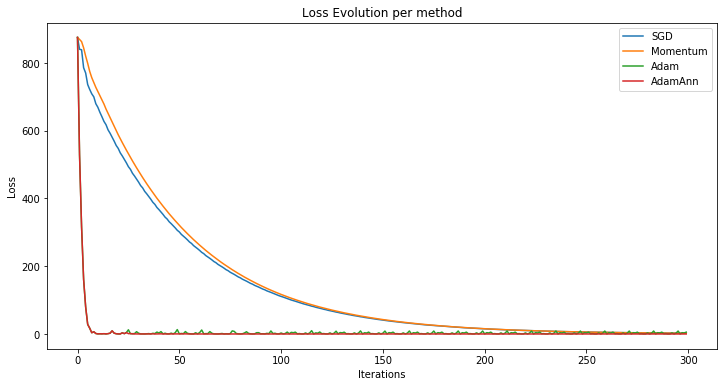

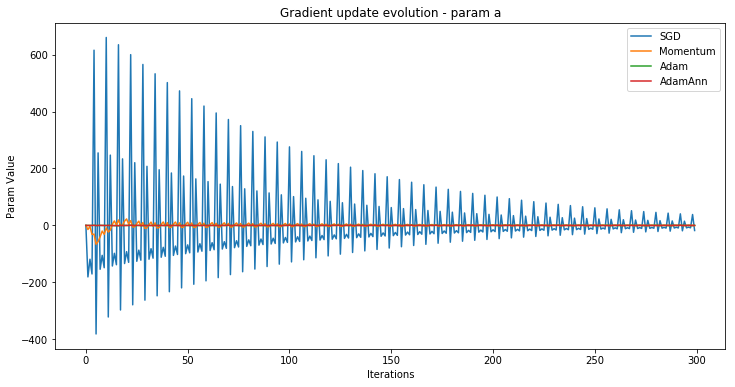

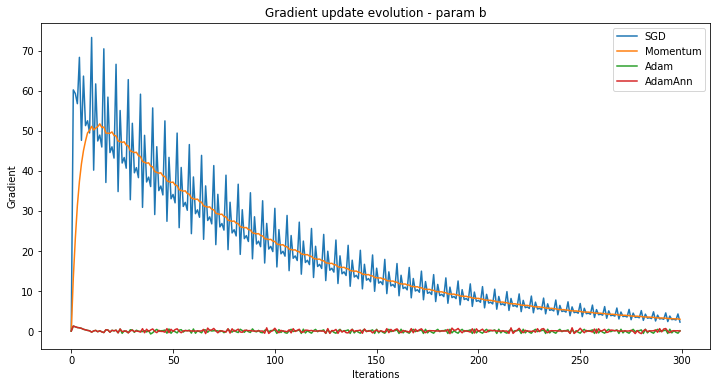

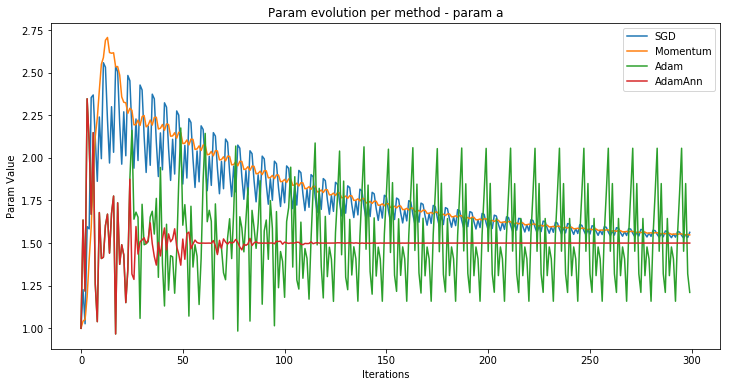

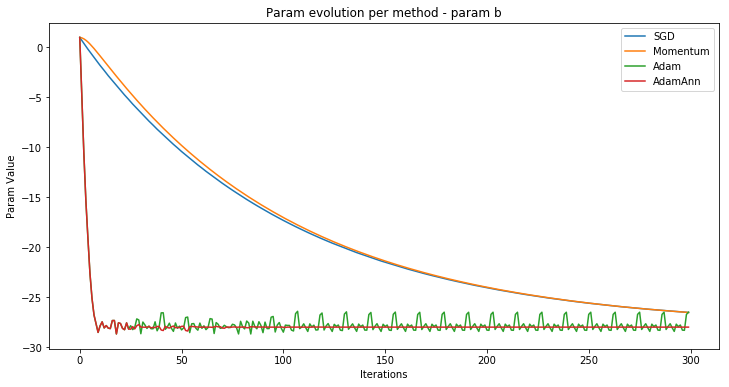

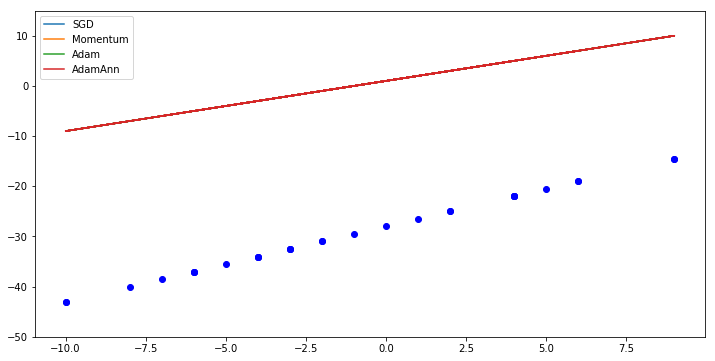

In [14]:
def lin(params,x):
    return params[0]*x + params[1]

def gen_data(real_params,f,xlim,data_size, seed=7):
    amplitude = xlim[1]-xlim[0]
    np.random.seed(7)    
    x_gen = np.random.randint(low=xlim[0], high=xlim[1], size=data_size)
    print(len(x_gen))
    y_real = f(real_params,x_gen)
    
    return x_gen,y_real
    

def linear_gradients(params_to_learn,x,y):
    a = params_to_learn[0] 
    b = params_to_learn[1]
    de_da = 2*x*(a*x+b-y)
    de_db = 2*(a*x+b-y)  
    
    return [de_da,de_db]

def mse(x,y,f,params):
    y_pred = f(params,x)
    diff_sq = (y_pred-y)*(y_pred-y)
    loss = diff_sq.sum() / len(x)
    return loss


def animate(i, coeffs_map_list, labels, f, x, y_actual, ylim=None):    
    ax.clear()
    if ylim is not None:
        plt.ylim(ylim)
    plt.plot(x, y_actual, 'bo')   
    
    for coeffs_map,l in zip(coeffs_map_list,labels):
        y_pred = f(coeffs_map[i],x)
        plt.plot(x, y_pred,label=l)  
    plt.legend(loc='upper left')
    
def draw_animation(m, labels, f, x, y_actual,interval_in_ms, ylim=None):
    anim = FuncAnimation(
        fig, animate, fargs=[m,labels,f,x,y_actual,ylim] , interval=interval_in_ms, frames=len(m[0]))
    return anim    

def gradient_descent(X,Y, init_params, f, gradients_func, optim, optim_params, epochs=1, 
                     anneal_epoch_freq=5, stat_gathering_freq=5):
    params_map = {}
    params_to_learn = init_params.copy()
    loss_evolution = []
    lr_evolution =  [[] for _ in range(len(params_to_learn))]
    gradient_evolution =  [[] for _ in range(len(params_to_learn))]
    params_to_learn_evolution =  [[] for _ in range(len(params_to_learn))]
    idx = 0
    total_iteration = 0
    wavg_grads = [0] * len(params_to_learn) #used if optim = Momentum or Adam
    wavg_squared_grads = [0] * len(params_to_learn) #used if optim = Adam
    grads_udpates = [0] * len(params_to_learn) #used for stats
    lr = optim_params[0] #the first param is always the learning rate
    
    for e in range(epochs):   
        if optim == "AdamAnn" and (e+1) % anneal_epoch_freq == 0:
            lr = lr / (4.0)                    
        for x_ , y_ in zip(X,Y):              
            gradients = gradients_func(params_to_learn,x_ ,y_)
            loss = mse(X,Y,f,params_to_learn)
            if total_iteration % stat_gathering_freq == 0:                
                params_map[idx] = params_to_learn.copy()
                idx = idx+1                
                loss_evolution.append(loss)               
                [gradient_evolution[i].append(grad) for (i,grad) in zip(range(len(grads_udpates)),grads_udpates)]                
                [params_to_learn_evolution[i].append(param) for (i,param) in zip(range(len(params_to_learn)),params_to_learn)]
                
            total_iteration += 1
            if optim == "SGD":
                for i in range(len(params_to_learn)):
                    params_to_learn[i] = params_to_learn[i] - lr*gradients[i]
                    grads_udpates[i] = gradients[i]
            elif optim == "Momentum":
                beta = optim_params[1]
                for i in range(len(params_to_learn)):
                    wavg_grads[i] = wavg_grads[i]*beta +  (1.0-beta)*gradients[i]
                    params_to_learn[i] = params_to_learn[i] - lr*wavg_grads[i]            
                    grads_udpates[i] = wavg_grads[i]
            elif optim == "Adam" or optim == "AdamAnn": #in case of AdamAnn, the lr is progressively decreased
                beta1 = optim_params[1]
                beta2 = optim_params[2]
                for i in range(len(params_to_learn)):
                    wavg_grads[i] = wavg_grads[i]*beta1 +  (1.0-beta1)*gradients[i]
                    wavg_squared_grads[i] = wavg_squared_grads[i]*beta2 + (1.0-beta2)*(gradients[i]*gradients[i])
                    update = wavg_grads[i] / np.sqrt(wavg_squared_grads[i])                       
                    params_to_learn[i] = params_to_learn[i] - lr*update  
                    grads_udpates[i] = update
                    
    params_map[idx] = params_to_learn.copy()
    print("learned params: {} , loss: {}".format(params_to_learn,loss))
    return params_map,loss_evolution,lr_evolution,gradient_evolution,params_to_learn_evolution
        

def compare_methods_and_plot( real_params, init_params, f,f_gradients, 
                             range_gen_data, size_gen_data, epochs, 
                             methods,methods_optim_params,
                             anim_interval_ms, ylim_anim=None ):
    print(real_params)
    X,Y = gen_data(real_params, f,range_gen_data,size_gen_data)            
    method_params_map_list = []
    loss_evolution_list = []
    lr_evolution_list = []
    params_to_learn_evolution_list = []
    gradient_evolution_list = []
    
    for method,method_params in zip(methods,methods_optim_params):
        p,loss_evol,lr_evolution,gradient_evolution,params_to_learn_evolution = gradient_descent(X,Y,init_params,f,f_gradients,method, method_params, epochs=epochs)         
        method_params_map_list.append(p)
        loss_evolution_list.append(loss_evol)
        lr_evolution_list.append(lr_evolution)
        gradient_evolution_list.append(gradient_evolution)
        params_to_learn_evolution_list.append(params_to_learn_evolution)

        
    fig, ax = plt.subplots(figsize=(12, 6))    
    plt.title("Loss Evolution per method")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    for loss,lab in zip(loss_evolution_list,methods):        
        plt.plot(loss,label=lab)  
        plt.legend(loc='upper right')
    plt.show()
    
    fig, ax = plt.subplots(figsize=(12, 6))    
    plt.title("Gradient update evolution - param a")
    plt.xlabel("Iterations")
    plt.ylabel("Param Value")
    for gradient_evolution,lab in zip(gradient_evolution_list,methods):        
        plt.plot(gradient_evolution[0],label=lab)  
        plt.legend(loc='upper right')
    plt.show() 
    
    fig, ax = plt.subplots(figsize=(12, 6))    
    plt.title("Gradient update evolution - param b")
    plt.xlabel("Iterations")
    plt.ylabel("Gradient")
    for gradient_evolution,lab in zip(gradient_evolution_list,methods):        
        plt.plot(gradient_evolution[1],label=lab)  
        plt.legend(loc='upper right')
    plt.show() 
    
    fig, ax = plt.subplots(figsize=(12, 6))    
    plt.title("Param evolution per method - param a")
    plt.xlabel("Iterations")
    plt.ylabel("Param Value")
    for params_to_learn_evolution,lab in zip(params_to_learn_evolution_list,methods):        
        plt.plot(params_to_learn_evolution[0],label=lab)  
        plt.legend(loc='upper right')
    plt.show() 
    
    fig, ax = plt.subplots(figsize=(12, 6))    
    plt.title("Param evolution per method - param b")
    plt.xlabel("Iterations")
    plt.ylabel("Param Value")
    for params_to_learn_evolution,lab in zip(params_to_learn_evolution_list,methods):        
        plt.plot(params_to_learn_evolution[1],label=lab)  
        plt.legend(loc='upper right')
    plt.show() 
    
    return method_params_map_list,methods,X,Y,loss_evolution_list,lr_evolution_list

params,methods,x,y, loss_evolution_list,lr_evolution_list = \
    compare_methods_and_plot([1.5,-28],[1,1],lin,
        linear_gradients,[-10,10],
        size_gen_data=30,
        epochs = 50,
        methods = ["SGD","Momentum","Adam","AdamAnn"],
        methods_optim_params = [[0.001] , [0.001,0.95] , [1,0.7,0.9] , [1,0.7,0.9] ],
        anim_interval_ms=100,ylim_anim=[-50,15])

fig, ax = plt.subplots(figsize=(12, 6))    
anim = draw_animation(params,methods, lin,x,y,75,ylim=[-50,15])
HTML(anim.to_jshtml())

# params,methods,x,y,loss_evolution_list,lr_evolution_list = compare_methods_and_plot([1.5,-28],[1,1],lin,
#                          linear_gradients,[-10,10],
#                          size_gen_data=30,
#                          epochs = 50,
#                          methods = ["SGD","AdamAnn"],
#                          methods_optim_params = [[0.001] , [1,0.7,0.9] ],
#                          anim_interval_ms=100,ylim_anim=[-50,15])

# params,methods,x,y,loss_evolution_list,lr_evolution_list = compare_methods_and_plot([1.5,-28],[1,1],lin,
#                          linear_gradients,[-10,10],
#                          size_gen_data=30,
#                          epochs = 50,
#                          methods = ["SGD","Momentum"],
#                          methods_optim_params = [[0.001] , [0.001,0.95] ],
#                          anim_interval_ms=100,ylim_anim=[-50,15])

